In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error


from prophet import Prophet
from xgboost import XGBRegressor

In [1]:
pip install darts

Note: you may need to restart the kernel to use updated packages.


In [2]:

pip install backtest

Note: you may need to restart the kernel to use updated packages.


In [3]:
df1=pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2014.csv')

In [4]:
df2 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2015.csv')

In [5]:
df3 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2016.csv')

In [6]:
df4 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2017.csv')

In [7]:
df5 =  pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2018.csv')

In [8]:
df6 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2019.csv')

In [9]:
df7 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2020.csv')

In [10]:
df8 =pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2021.csv')

In [11]:
df9 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2022.csv')

In [12]:
miami_df1 = df1[(df1['fips_code'] == 12086) & (df1['county'] == 'Miami-Dade')]

In [13]:
miami_df1['run_start_time'] = pd.to_datetime(miami_df1['run_start_time'])

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\246605523.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df1['run_start_time'] = pd.to_datetime(miami_df1['run_start_time'])


In [14]:
# Convert run_start_time to datetime format
miami_df1['run_start_time'] = pd.to_datetime(miami_df1['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df1.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\2306587600.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df1['run_start_time'] = pd.to_datetime(miami_df1['run_start_time'])


In [15]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df1 =miami_df1.resample('D')['sum'].max()

In [16]:
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df1 = daily_max_outages_miami_df1.to_frame().reset_index()

In [17]:
# Rename the columns for clarity
daily_max_outages_miami_df1.columns = ['Date', 'Highest_Outage']

In [18]:

print(daily_max_outages_miami_df1)

         Date  Highest_Outage
0  2014-11-01            1822
1  2014-11-02            4260
2  2014-11-03            2325
3  2014-11-04            5615
4  2014-11-05            2723
..        ...             ...
56 2014-12-27             332
57 2014-12-28            5451
58 2014-12-29            2279
59 2014-12-30             249
60 2014-12-31              57

[61 rows x 2 columns]


In [19]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df1 = miami_df1.resample('H')['sum'].max()

In [20]:
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df1 = hourly_max_outages_miami_df1.to_frame().reset_index()

In [21]:
# Rename the columns for clarity
hourly_max_outages_miami_df1.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df1)

                    Date  Highest_Outage
0    2014-11-01 04:00:00           216.0
1    2014-11-01 05:00:00           245.0
2    2014-11-01 06:00:00          1822.0
3    2014-11-01 07:00:00           253.0
4    2014-11-01 08:00:00           157.0
...                  ...             ...
1432 2014-12-30 20:00:00           110.0
1433 2014-12-30 21:00:00           118.0
1434 2014-12-30 22:00:00           104.0
1435 2014-12-30 23:00:00           101.0
1436 2014-12-31 00:00:00            57.0

[1437 rows x 2 columns]


In [22]:
hourly_max_outages_miami_df1 = hourly_max_outages_miami_df1.fillna(0)

In [23]:
hourly_max_outages_miami_df1

,Date,Highest_Outage
0,2014-11-01 04:00:00,216.0
1,2014-11-01 05:00:00,245.0
2,2014-11-01 06:00:00,1822.0
3,2014-11-01 07:00:00,253.0
4,2014-11-01 08:00:00,157.0
...,...,...
1432,2014-12-30 20:00:00,110.0
1433,2014-12-30 21:00:00,118.0
1434,2014-12-30 22:00:00,104.0
1435,2014-12-30 23:00:00,101.0


In [24]:
miami_df2 = df2[(df2['fips_code'] == 12086) & (df2['county'] == 'Miami-Dade')]




In [25]:
miami_df2['run_start_time'] = pd.to_datetime(miami_df2['run_start_time'])

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\3983012778.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df2['run_start_time'] = pd.to_datetime(miami_df2['run_start_time'])


In [26]:

# Set the run_start_time column as the DataFrame index
miami_df2.set_index('run_start_time', inplace=True)

In [27]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df2 =miami_df2.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df2 = daily_max_outages_miami_df2.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df2.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df2)

          Date  Highest_Outage
0   2015-01-01            1613
1   2015-01-02             383
2   2015-01-03            2207
3   2015-01-04             856
4   2015-01-05            2559
..         ...             ...
360 2015-12-27             645
361 2015-12-28             106
362 2015-12-29             116
363 2015-12-30            1796
364 2015-12-31              45

[365 rows x 2 columns]


In [28]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df2 = miami_df2.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df2 = hourly_max_outages_miami_df2.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df2.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df2)
hourly_max_outages_miami_df2 = hourly_max_outages_miami_df2.fillna(0)
hourly_max_outages_miami_df2

                    Date  Highest_Outage
0    2015-01-01 00:00:00            43.0
1    2015-01-01 01:00:00            63.0
2    2015-01-01 02:00:00            75.0
3    2015-01-01 03:00:00            65.0
4    2015-01-01 04:00:00            30.0
...                  ...             ...
8732 2015-12-30 20:00:00            44.0
8733 2015-12-30 21:00:00            50.0
8734 2015-12-30 22:00:00            66.0
8735 2015-12-30 23:00:00            46.0
8736 2015-12-31 00:00:00            45.0

[8737 rows x 2 columns]


,Date,Highest_Outage
0,2015-01-01 00:00:00,43.0
1,2015-01-01 01:00:00,63.0
2,2015-01-01 02:00:00,75.0
3,2015-01-01 03:00:00,65.0
4,2015-01-01 04:00:00,30.0
...,...,...
8732,2015-12-30 20:00:00,44.0
8733,2015-12-30 21:00:00,50.0
8734,2015-12-30 22:00:00,66.0
8735,2015-12-30 23:00:00,46.0


In [29]:
miami_df3 = df3[(df3['fips_code'] == 12086) & (df3['county'] == 'Miami-Dade')]

In [30]:
miami_df3['run_start_time'] = pd.to_datetime(miami_df3['run_start_time'])

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\2987743143.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df3['run_start_time'] = pd.to_datetime(miami_df3['run_start_time'])


In [31]:

# Set the run_start_time column as the DataFrame index
miami_df3.set_index('run_start_time', inplace=True)

In [32]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df3 =miami_df3.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df3 = daily_max_outages_miami_df3.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df3.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df3)

          Date  Highest_Outage
0   2016-01-01             171
1   2016-01-02            1105
2   2016-01-03            6441
3   2016-01-04            5710
4   2016-01-05             743
..         ...             ...
361 2016-12-27             479
362 2016-12-28            1351
363 2016-12-29             349
364 2016-12-30            1660
365 2016-12-31             116

[366 rows x 2 columns]


In [33]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df3 = miami_df3.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df3 = hourly_max_outages_miami_df3.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df3.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df3)
hourly_max_outages_miami_df3 = hourly_max_outages_miami_df3.fillna(0)
hourly_max_outages_miami_df3

                    Date  Highest_Outage
0    2016-01-01 00:00:00           132.0
1    2016-01-01 01:00:00           171.0
2    2016-01-01 02:00:00           171.0
3    2016-01-01 03:00:00           139.0
4    2016-01-01 04:00:00            94.0
...                  ...             ...
8756 2016-12-30 20:00:00           155.0
8757 2016-12-30 21:00:00           107.0
8758 2016-12-30 22:00:00           137.0
8759 2016-12-30 23:00:00           183.0
8760 2016-12-31 00:00:00           116.0

[8761 rows x 2 columns]


,Date,Highest_Outage
0,2016-01-01 00:00:00,132.0
1,2016-01-01 01:00:00,171.0
2,2016-01-01 02:00:00,171.0
3,2016-01-01 03:00:00,139.0
4,2016-01-01 04:00:00,94.0
...,...,...
8756,2016-12-30 20:00:00,155.0
8757,2016-12-30 21:00:00,107.0
8758,2016-12-30 22:00:00,137.0
8759,2016-12-30 23:00:00,183.0


In [34]:
miami_df4 = df4[(df4['fips_code'] == 12086) & (df4['county'] == 'Miami-Dade')]

In [35]:
miami_df4['run_start_time'] = pd.to_datetime(miami_df4['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df4.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\490334219.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df4['run_start_time'] = pd.to_datetime(miami_df4['run_start_time'])


In [36]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df4 =miami_df4.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df4 = daily_max_outages_miami_df4.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df4.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df4)

          Date  Highest_Outage
0   2017-01-01           545.0
1   2017-01-02          2671.0
2   2017-01-03          1883.0
3   2017-01-04          3732.0
4   2017-01-05           298.0
..         ...             ...
360 2017-12-27           275.0
361 2017-12-28          2822.0
362 2017-12-29           203.0
363 2017-12-30           110.0
364 2017-12-31            13.0

[365 rows x 2 columns]


In [37]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df4 = miami_df4.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df4 = hourly_max_outages_miami_df4.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df4.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df4)
hourly_max_outages_miami_df4 = hourly_max_outages_miami_df4.fillna(0)
hourly_max_outages_miami_df4

                    Date  Highest_Outage
0    2017-01-01 00:00:00           545.0
1    2017-01-01 01:00:00            79.0
2    2017-01-01 02:00:00            79.0
3    2017-01-01 03:00:00            22.0
4    2017-01-01 04:00:00           186.0
...                  ...             ...
8732 2017-12-30 20:00:00            46.0
8733 2017-12-30 21:00:00            46.0
8734 2017-12-30 22:00:00             7.0
8735 2017-12-30 23:00:00             7.0
8736 2017-12-31 00:00:00            13.0

[8737 rows x 2 columns]


,Date,Highest_Outage
0,2017-01-01 00:00:00,545.0
1,2017-01-01 01:00:00,79.0
2,2017-01-01 02:00:00,79.0
3,2017-01-01 03:00:00,22.0
4,2017-01-01 04:00:00,186.0
...,...,...
8732,2017-12-30 20:00:00,46.0
8733,2017-12-30 21:00:00,46.0
8734,2017-12-30 22:00:00,7.0
8735,2017-12-30 23:00:00,7.0


In [38]:
miami_df5 = df5[(df5['fips_code'] == 12086) & (df5['county'] == 'Miami-Dade')]

In [39]:
miami_df5['run_start_time'] = pd.to_datetime(miami_df5['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df5.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\126897581.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df5['run_start_time'] = pd.to_datetime(miami_df5['run_start_time'])


In [40]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df5 =miami_df5.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df5 = daily_max_outages_miami_df5.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df5.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df5)

          Date  Highest_Outage
0   2018-01-01          2408.0
1   2018-01-02          3129.0
2   2018-01-03          9059.0
3   2018-01-04          1485.0
4   2018-01-05           399.0
..         ...             ...
360 2018-12-27          3496.0
361 2018-12-28          1890.0
362 2018-12-29           285.0
363 2018-12-30          1347.0
364 2018-12-31            60.0

[365 rows x 2 columns]


In [41]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df5 = miami_df5.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df5 = hourly_max_outages_miami_df5.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df5.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df5)
hourly_max_outages_miami_df5 = hourly_max_outages_miami_df5.fillna(0)
hourly_max_outages_miami_df5

                    Date  Highest_Outage
0    2018-01-01 00:00:00          2043.0
1    2018-01-01 01:00:00            54.0
2    2018-01-01 02:00:00            32.0
3    2018-01-01 03:00:00          2076.0
4    2018-01-01 04:00:00          1054.0
...                  ...             ...
8732 2018-12-30 20:00:00           563.0
8733 2018-12-30 21:00:00           441.0
8734 2018-12-30 22:00:00           129.0
8735 2018-12-30 23:00:00           346.0
8736 2018-12-31 00:00:00            60.0

[8737 rows x 2 columns]


,Date,Highest_Outage
0,2018-01-01 00:00:00,2043.0
1,2018-01-01 01:00:00,54.0
2,2018-01-01 02:00:00,32.0
3,2018-01-01 03:00:00,2076.0
4,2018-01-01 04:00:00,1054.0
...,...,...
8732,2018-12-30 20:00:00,563.0
8733,2018-12-30 21:00:00,441.0
8734,2018-12-30 22:00:00,129.0
8735,2018-12-30 23:00:00,346.0


In [42]:
miami_df6 = df6[(df6['fips_code'] == 12086) & (df6['county'] == 'Miami-Dade')]

In [43]:
miami_df6['run_start_time'] = pd.to_datetime(miami_df6['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df6.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\1541949127.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df6['run_start_time'] = pd.to_datetime(miami_df6['run_start_time'])


In [44]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df6 =miami_df6.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df6 = daily_max_outages_miami_df6.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df6.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df6)

          Date  Highest_Outage
0   2019-01-01           248.0
1   2019-01-02          2064.0
2   2019-01-03           813.0
3   2019-01-04          2564.0
4   2019-01-05          2721.0
..         ...             ...
360 2019-12-27           356.0
361 2019-12-28           320.0
362 2019-12-29          2880.0
363 2019-12-30           122.0
364 2019-12-31            61.0

[365 rows x 2 columns]


In [45]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df6 = miami_df6.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df6 = hourly_max_outages_miami_df6.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df6.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df6)
hourly_max_outages_miami_df6 = hourly_max_outages_miami_df6.fillna(0)
hourly_max_outages_miami_df6

                    Date  Highest_Outage
0    2019-01-01 00:00:00            75.0
1    2019-01-01 01:00:00           248.0
2    2019-01-01 02:00:00           247.0
3    2019-01-01 03:00:00           248.0
4    2019-01-01 04:00:00           145.0
...                  ...             ...
8732 2019-12-30 20:00:00            51.0
8733 2019-12-30 21:00:00            48.0
8734 2019-12-30 22:00:00            29.0
8735 2019-12-30 23:00:00            26.0
8736 2019-12-31 00:00:00            61.0

[8737 rows x 2 columns]


,Date,Highest_Outage
0,2019-01-01 00:00:00,75.0
1,2019-01-01 01:00:00,248.0
2,2019-01-01 02:00:00,247.0
3,2019-01-01 03:00:00,248.0
4,2019-01-01 04:00:00,145.0
...,...,...
8732,2019-12-30 20:00:00,51.0
8733,2019-12-30 21:00:00,48.0
8734,2019-12-30 22:00:00,29.0
8735,2019-12-30 23:00:00,26.0


In [46]:
miami_df7 = df7[(df7['fips_code'] == 12086) & (df7['county'] == 'Miami-Dade')]

In [47]:
miami_df7['run_start_time'] = pd.to_datetime(miami_df7['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df7.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\1917895754.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df7['run_start_time'] = pd.to_datetime(miami_df7['run_start_time'])


In [48]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df7 =miami_df7.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df7 = daily_max_outages_miami_df7.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df7.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df7)

          Date  Highest_Outage
0   2020-01-01           340.0
1   2020-01-02           478.0
2   2020-01-03          2181.0
3   2020-01-04          2317.0
4   2020-01-05          1949.0
..         ...             ...
361 2020-12-27          3113.0
362 2020-12-28          1659.0
363 2020-12-29           161.0
364 2020-12-30          2375.0
365 2020-12-31            25.0

[366 rows x 2 columns]


In [49]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df7 = miami_df7.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df7 = hourly_max_outages_miami_df7.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df7.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df7)
hourly_max_outages_miami_df7 = hourly_max_outages_miami_df7.fillna(0)
hourly_max_outages_miami_df7

                    Date  Highest_Outage
0    2020-01-01 00:00:00           124.0
1    2020-01-01 01:00:00            91.0
2    2020-01-01 02:00:00            92.0
3    2020-01-01 03:00:00            30.0
4    2020-01-01 04:00:00           301.0
...                  ...             ...
8756 2020-12-30 20:00:00            63.0
8757 2020-12-30 21:00:00            63.0
8758 2020-12-30 22:00:00            86.0
8759 2020-12-30 23:00:00            86.0
8760 2020-12-31 00:00:00            25.0

[8761 rows x 2 columns]


,Date,Highest_Outage
0,2020-01-01 00:00:00,124.0
1,2020-01-01 01:00:00,91.0
2,2020-01-01 02:00:00,92.0
3,2020-01-01 03:00:00,30.0
4,2020-01-01 04:00:00,301.0
...,...,...
8756,2020-12-30 20:00:00,63.0
8757,2020-12-30 21:00:00,63.0
8758,2020-12-30 22:00:00,86.0
8759,2020-12-30 23:00:00,86.0


In [50]:
miami_df8 = df8[(df8['fips_code'] == 12086) & (df8['county'] == 'Miami-Dade')]

In [51]:
miami_df8['run_start_time'] = pd.to_datetime(miami_df8['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df8.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\3893904548.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df8['run_start_time'] = pd.to_datetime(miami_df8['run_start_time'])


In [52]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df8 =miami_df8.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df8 = daily_max_outages_miami_df8.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df8.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df8)

          Date  Highest_Outage
0   2021-01-01           712.0
1   2021-01-02          2373.0
2   2021-01-03           563.0
3   2021-01-04          1653.0
4   2021-01-05          2212.0
..         ...             ...
360 2021-12-27           121.0
361 2021-12-28           472.0
362 2021-12-29           699.0
363 2021-12-30           313.0
364 2021-12-31           197.0

[365 rows x 2 columns]


In [53]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df8 = miami_df8.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df8 = hourly_max_outages_miami_df8.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df8.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df8)
hourly_max_outages_miami_df8 = hourly_max_outages_miami_df8.fillna(0)
hourly_max_outages_miami_df8

                    Date  Highest_Outage
0    2021-01-01 00:00:00            91.0
1    2021-01-01 01:00:00            68.0
2    2021-01-01 02:00:00            67.0
3    2021-01-01 03:00:00            27.0
4    2021-01-01 04:00:00            23.0
...                  ...             ...
8732 2021-12-30 20:00:00           257.0
8733 2021-12-30 21:00:00           231.0
8734 2021-12-30 22:00:00           218.0
8735 2021-12-30 23:00:00           216.0
8736 2021-12-31 00:00:00           197.0

[8737 rows x 2 columns]


,Date,Highest_Outage
0,2021-01-01 00:00:00,91.0
1,2021-01-01 01:00:00,68.0
2,2021-01-01 02:00:00,67.0
3,2021-01-01 03:00:00,27.0
4,2021-01-01 04:00:00,23.0
...,...,...
8732,2021-12-30 20:00:00,257.0
8733,2021-12-30 21:00:00,231.0
8734,2021-12-30 22:00:00,218.0
8735,2021-12-30 23:00:00,216.0


In [54]:
miami_df9 = df9[(df9['fips_code'] == 12086) & (df9['county'] == 'Miami-Dade')]

In [55]:
miami_df9['run_start_time'] = pd.to_datetime(miami_df9['run_start_time'])

# Set the run_start_time column as the DataFrame index
miami_df9.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\3374781361.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  miami_df9['run_start_time'] = pd.to_datetime(miami_df9['run_start_time'])


In [56]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outages_miami_df9 =miami_df9.resample('D')['sum'].max()
# Create a new DataFrame from the resampled data
daily_max_outages_miami_df9 = daily_max_outages_miami_df9.to_frame().reset_index()
# Rename the columns for clarity
daily_max_outages_miami_df9.columns = ['Date', 'Highest_Outage']

print(daily_max_outages_miami_df9)

          Date  Highest_Outage
0   2022-01-01          1456.0
1   2022-01-02          2715.0
2   2022-01-03          1606.0
3   2022-01-04          3313.0
4   2022-01-05           404.0
..         ...             ...
311 2022-11-08          2423.0
312 2022-11-09          3465.0
313 2022-11-10          3458.0
314 2022-11-11            20.0
315 2022-11-12             NaN

[316 rows x 2 columns]


In [57]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_miami_df9 = miami_df9.resample('H')['sum'].max()
# Create a new DataFrame from the resampled data
hourly_max_outages_miami_df9 = hourly_max_outages_miami_df9.to_frame().reset_index()
# Rename the columns for clarity
hourly_max_outages_miami_df9.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_miami_df9)
hourly_max_outages_miami_df9 = hourly_max_outages_miami_df9.fillna(0)
hourly_max_outages_miami_df9

                    Date  Highest_Outage
0    2022-01-01 00:00:00           167.0
1    2022-01-01 01:00:00           119.0
2    2022-01-01 02:00:00           103.0
3    2022-01-01 03:00:00           208.0
4    2022-01-01 04:00:00           191.0
...                  ...             ...
7561 2022-11-12 01:00:00             NaN
7562 2022-11-12 02:00:00             NaN
7563 2022-11-12 03:00:00             NaN
7564 2022-11-12 04:00:00             NaN
7565 2022-11-12 05:00:00             NaN

[7566 rows x 2 columns]


,Date,Highest_Outage
0,2022-01-01 00:00:00,167.0
1,2022-01-01 01:00:00,119.0
2,2022-01-01 02:00:00,103.0
3,2022-01-01 03:00:00,208.0
4,2022-01-01 04:00:00,191.0
...,...,...
7561,2022-11-12 01:00:00,0.0
7562,2022-11-12 02:00:00,0.0
7563,2022-11-12 03:00:00,0.0
7564,2022-11-12 04:00:00,0.0


In [58]:
df_final = pd.concat([hourly_max_outages_miami_df1,hourly_max_outages_miami_df2,hourly_max_outages_miami_df3,hourly_max_outages_miami_df4,hourly_max_outages_miami_df5,hourly_max_outages_miami_df6,hourly_max_outages_miami_df7,hourly_max_outages_miami_df8,hourly_max_outages_miami_df9])

In [59]:
df_final

,Date,Highest_Outage
0,2014-11-01 04:00:00,216.0
1,2014-11-01 05:00:00,245.0
2,2014-11-01 06:00:00,1822.0
3,2014-11-01 07:00:00,253.0
4,2014-11-01 08:00:00,157.0
...,...,...
7561,2022-11-12 01:00:00,0.0
7562,2022-11-12 02:00:00,0.0
7563,2022-11-12 03:00:00,0.0
7564,2022-11-12 04:00:00,0.0


In [60]:
# Convert run_start_time to datetime format
df_final['Date'] = pd.to_datetime(df_final['Date'])

# Set the run_start_time column as the DataFrame index
df_final.set_index('Date', inplace=True)

Text(0.5, 1.0, 'outage from 2018-01-01 to 2018-01-08')

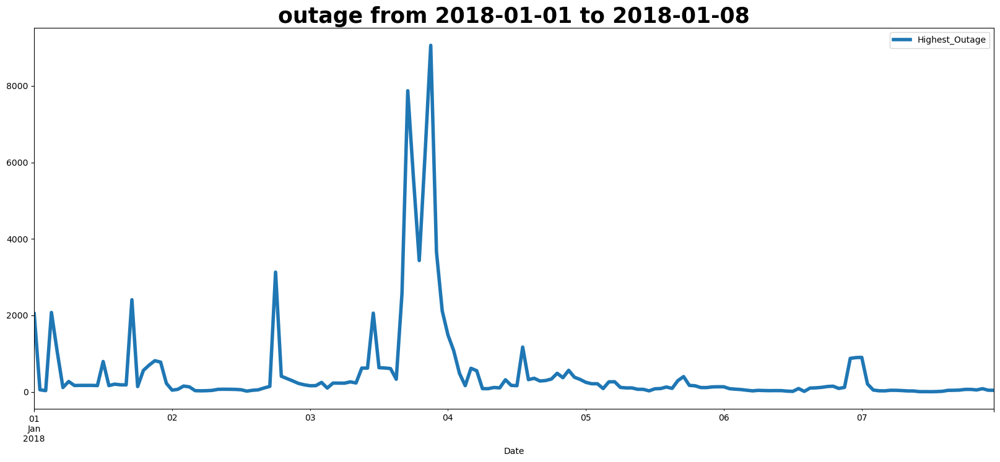

In [61]:
df_2018 = df_final[(df_final.index >= '2018-01-01') & (df_final.index < '2018-01-08')]

df_2018.plot(figsize=(20,8), lw=4)
plt.title('outage from 2018-01-01 to 2018-01-08', weight='bold', fontsize=25)

In [62]:
df = df_final.sort_index()

In [63]:
df

,Highest_Outage
Date,
2014-11-01 04:00:00,216.0
2014-11-01 05:00:00,245.0
2014-11-01 06:00:00,1822.0
2014-11-01 07:00:00,253.0
2014-11-01 08:00:00,157.0
...,...
2022-11-12 01:00:00,0.0
2022-11-12 02:00:00,0.0
2022-11-12 03:00:00,0.0


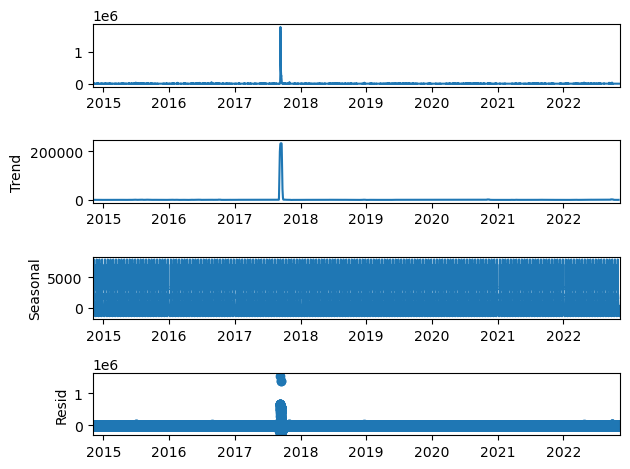

In [64]:
seasonal_decompose(df, period=365).plot()
plt.show()

In [65]:
# Daily Consumption
ma = df.resample('D').mean()

# 3 Day Example
ma['Moving Average'] = ma['Highest_Outage'].rolling(3).mean()
ma.head()

,Highest_Outage,Moving Average
Date,,
2014-11-01,783.550000,NaN
2014-11-02,1070.083333,NaN
2014-11-03,247.875000,700.502778
2014-11-04,409.541667,575.833333
2014-11-05,365.875000,341.097222


In [66]:
ma

,Highest_Outage,Moving Average
Date,,
2014-11-01,783.550000,NaN
2014-11-02,1070.083333,NaN
2014-11-03,247.875000,700.502778
2014-11-04,409.541667,575.833333
2014-11-05,365.875000,341.097222
...,...,...
2022-11-08,533.333333,348.902778
2022-11-09,1835.291667,928.430556
2022-11-10,1389.833333,1252.819444


In [67]:
def moving_average(data, window):
    data['Moving Average'] = data['Highest_Outage'].rolling(window).mean()
    actual = data['Highest_Outage'][-(window+30):]
    ma = data['Moving Average'][-(window+30):]
    
    plt.figure(figsize=(20,8))
    actual.plot(label='Actual', lw=4)
    ma.plot(label='MA-{}'.format(str(window)), ls='--', lw=2)
    plt.title('{}-Days Moving Average'.format(str(window)), weight='bold', fontsize=25)
    plt.legend()

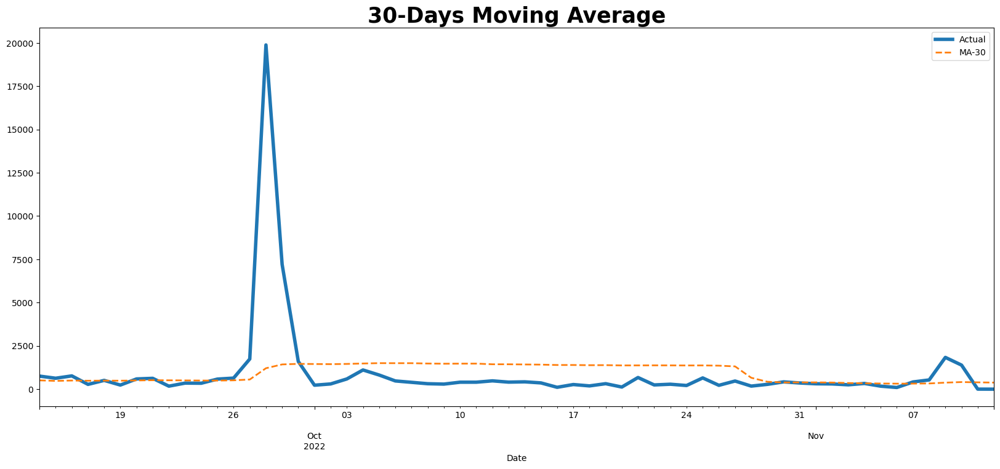

In [68]:
moving_average(ma, 30)

In [69]:
# Before building and training our model, let's split the data into training and testing
df_train, df_test = df[df.index < '2016-01-01'], df[df.index >= '2016-01-01']

print('Train:\t', len(df_train))
print('Test:\t', len(df_test))

Train:	 10174
Test:	 60036


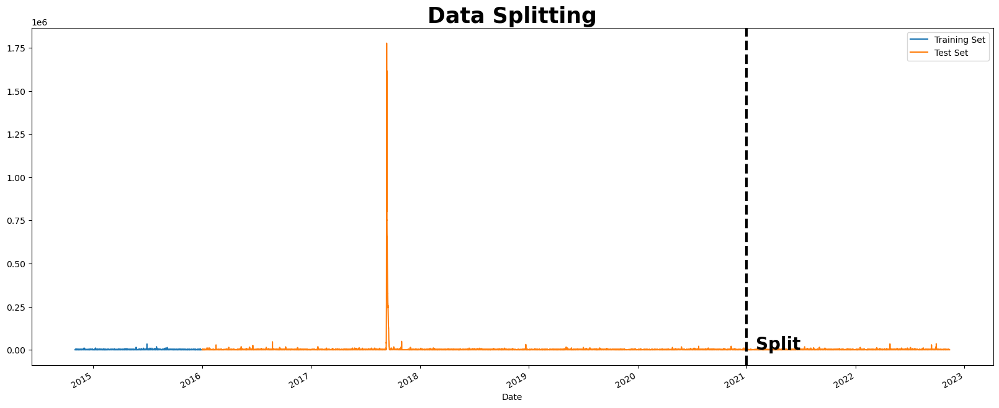

In [70]:
plt.figure(figsize=(20,8))

df_train['Highest_Outage'].plot(label='Training Set')
df_test['Highest_Outage'].plot(label='Test Set')
plt.axvline('2021-01-01', color='black', ls='--', lw=3)
plt.text('2021-02-01', 3700, 'Split', fontsize=20, fontweight='bold')
plt.title('Data Splitting', weight='bold', fontsize=25)
plt.legend()

In [71]:
def index_to_column(data):
    data = data.reset_index()
    data['Date'] = pd.to_datetime(data['Date'])
    data = data.sort_values('Date')
    data=data.rename(columns={'Date':'ds','Highest_Outage': 'y'})
    return data

In [72]:
prophet_train = index_to_column(df_train)
prophet_test = index_to_column(df_test)

In [73]:
prophet_model = Prophet(interval_width=0.95)

prophet_model.fit(prophet_train)
prophet_pred = prophet_model.predict(prophet_test[['ds']])

16:00:38 - cmdstanpy - INFO - Chain [1] start processing
16:00:39 - cmdstanpy - INFO - Chain [1] done processing


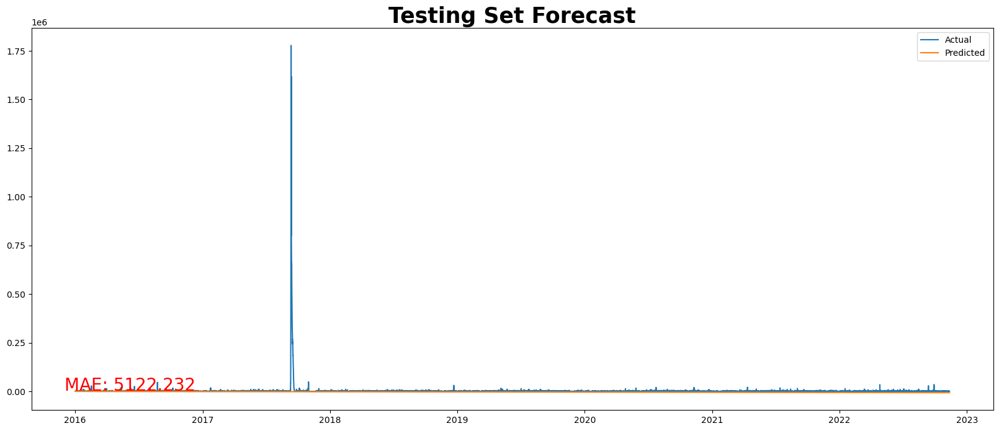

In [74]:
mae = round(mean_absolute_error(prophet_test['y'], prophet_pred['yhat']), 3)

plt.figure(figsize=(20,8))
plt.plot(prophet_test['ds'], prophet_test['y'], label='Actual')
plt.plot(prophet_pred['ds'], prophet_pred['yhat'], label='Predicted')
plt.title('Test Forecasting', weight='bold', fontsize=40)
plt.text(16770, 3250, 'MAE: {}'.format(mae), fontsize=20, color='red')
plt.title('Testing Set Forecast', weight='bold', fontsize=25)
plt.legend()

In [75]:
# This time, we will use all data (train and test) to train our model
new_df = index_to_column(df)

In [76]:
prophet_model2 = Prophet(interval_width=0.95)
prophet_model2.fit(new_df)
# 7 days to the future (7x24 = 168)
future_dates = prophet_model2.make_future_dataframe(periods=168, freq='H')
prophet_pred2 = prophet_model2.predict(future_dates)

16:01:02 - cmdstanpy - INFO - Chain [1] start processing
16:01:51 - cmdstanpy - INFO - Chain [1] done processing


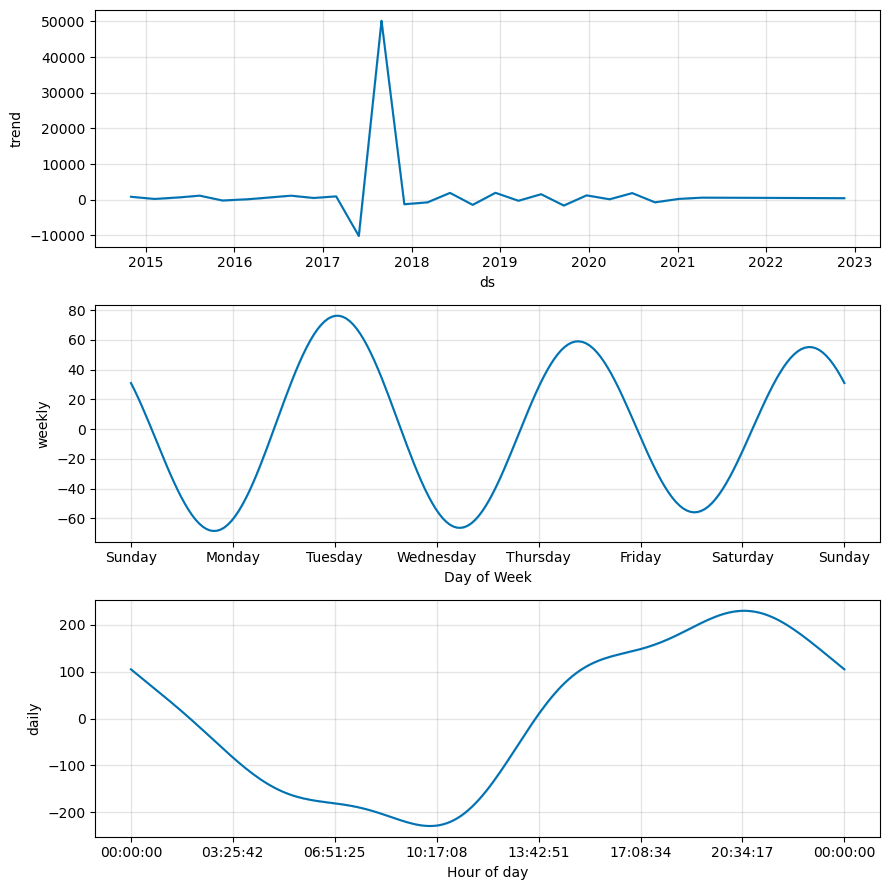

In [77]:
prophet_model.plot_components(prophet_pred2)
plt.show()

<Figure size 2000x800 with 0 Axes>

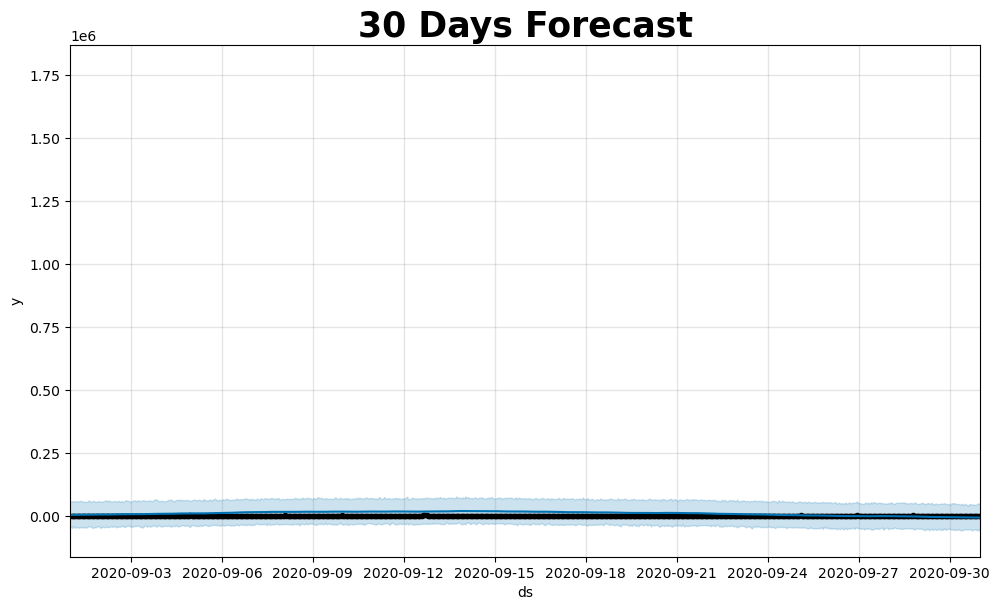

In [78]:
future_dates2 = prophet_model2.make_future_dataframe(periods=720, freq='H')
prophet_pred3 = prophet_model2.predict(future_dates2)

plt.figure(figsize=(20,8))

fig = prophet_model2.plot(prophet_pred3, uncertainty=True)
ax = fig.gca()
ax.set_xlim(pd.to_datetime(['2020-09-01', '2020-10-01']))
plt.title('30 Days Forecast', weight='bold', fontsize=25)
plt.show()

In [79]:
df

,Highest_Outage
Date,
2014-11-01 04:00:00,216.0
2014-11-01 05:00:00,245.0
2014-11-01 06:00:00,1822.0
2014-11-01 07:00:00,253.0
2014-11-01 08:00:00,157.0
...,...
2022-11-12 01:00:00,0.0
2022-11-12 02:00:00,0.0
2022-11-12 03:00:00,0.0


In [80]:
df.shape

(70210, 1)

In [81]:
df['date'] = df.index
df['hour'] = df['date'].dt.hour
df['day_of_week'] = df['date'].dt.dayofweek
df['weekday_name'] = df['date'].dt.day_name()
df['quarter'] = df['date'].dt.quarter
df['month'] = df['date'].dt.month
df['year'] = df['date'].dt.year
df['day_of_year'] = df['date'].dt.dayofyear
df['day_of_month'] = df['date'].dt.day
df['week_of_year'] = df['date'].dt.weekofyear

df.head()

C:\Users\halee\AppData\Local\Temp\ipykernel_22880\1400370480.py:10: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['week_of_year'] = df['date'].dt.weekofyear


,Highest_Outage,date,hour,day_of_week,weekday_name,quarter,month,year,day_of_year,day_of_month,week_of_year
Date,,,,,,,,,,,
2014-11-01 04:00:00,216.0,2014-11-01 04:00:00,4,5,Saturday,4,11,2014,305,1,44
2014-11-01 05:00:00,245.0,2014-11-01 05:00:00,5,5,Saturday,4,11,2014,305,1,44
2014-11-01 06:00:00,1822.0,2014-11-01 06:00:00,6,5,Saturday,4,11,2014,305,1,44
2014-11-01 07:00:00,253.0,2014-11-01 07:00:00,7,5,Saturday,4,11,2014,305,1,44
2014-11-01 08:00:00,157.0,2014-11-01 08:00:00,8,5,Saturday,4,11,2014,305,1,44


In [82]:
import pandas as pd
import math
import numpy as np

# ---------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
import pylab 
plt.rcParams['figure.figsize']=(17,5)

# ---------------------------------------
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot

In [83]:
import holidays
from sklearn.metrics import mean_squared_error, mean_absolute_error

import warnings
warnings.filterwarnings("ignore")

In [238]:
def line_plot(df, date, AEP, text, y_tiltle, x_title):
    data = go.Scatter(x = df[date],
                      y = df[AEP],
                      mode = 'lines',
                      name = AEP)

    layout = go.Layout(title={'text': text,
                              'y':0.9,
                              'x':0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'},
                       xaxis = dict(title = x_title),
                       yaxis = dict(title = y_tiltle),
                       )

    fig = go.Figure(data = data, layout = layout)
    iplot(fig)
    
# ---------------------------------------
def new_df(df, col, new_date, new_AEP, split):
    tmp_df = df[[col]].reset_index().rename(columns={'Date':new_date, 'Highest_Outage':new_AEP})
    tmp_df = pd.DataFrame(tmp_df.resample(split, on='Date', origin = 'start').mean())
    tmp_df.reset_index(inplace=True)
    return tmp_df

# ---------------------------------------
def bar_plot(col1, col2, agg_func, title, xtitle, ytitle):
    data = go.Bar(x = df.groupby(col1).agg({col2: agg_func}). \
              reset_index()[col1],
              y = df.groupby(col1).agg({col2: agg_func}). \
              reset_index()[col2],
              text =round(df.groupby(col1).agg({col2: agg_func}).reset_index()[col2],2),
              textposition= 'outside')

    layout = go.Layout(title={'text': title,
                              'y':0.9,
                              'x':0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'},
                       xaxis = dict(title = xtitle),
                       yaxis = dict(title = ytitle),
                       )

    fig = go.Figure(data = data, layout = layout)
    iplot(fig)


# ---------------------------------------
def box_plot(q_num, col1, col2, color, title, xtitle, ytitle):
    box = go.Box(x = df.loc[df['quarter']==q_num][col1],
                       y = df.loc[df['quarter']==q_num][col2],
                       name = col1, 
                       marker_color= color)

    layout = go.Layout(title={'text': title,
                              'y':0.9,
                              'x':0.5,
                              'xanchor': 'center',
                              'yanchor': 'top'},
                       xaxis = dict(title = xtitle),
                       yaxis = dict(title = ytitle),
                       )


    fig = go.Figure(data = box, layout = layout)
    iplot(fig)


# ---------------------------------------
def MAPE(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [239]:
line_plot(df, 'date', 'Highest_Outage', 'American Electric Power Outage- Hourly for Florida', 'Highest_Outage', 'year')

In [240]:
df_monthly = new_df(df, 'Highest_Outage', 'Date', 'monthly', 'M')
df_monthly.head()

,Date,monthly
0,2014-11-30,395.918994
1,2014-12-31,317.614424
2,2015-01-31,346.482527
3,2015-02-28,360.559524
4,2015-03-31,318.698925


In [242]:
line_plot(df_monthly, 'Date', 'monthly', 'American Electric Power outage for Miami-Dade Monthly', 'monthly outage', 'year')

In [88]:
fig = px.line(df, x='date', y='Highest_Outage', 
              title='American Electric Power outage with Range Slider and Selectors', 
             )

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

In [245]:
scatter = [go.Scatter(x = df['hour'],
                      y = df['Highest_Outage'],
                      mode ='markers',
                      marker = dict(color = df['Highest_Outage'],
                                    showscale = True,
                                   
                                   colorbar = dict(title='Highest_Outage'),
                                    size = 9,
                                    opacity = 0.55))]

layout = go.Layout(title={'text': "American Electric Power outage of Miami by hour of day",
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Day'),
                   yaxis = dict(title = 'Highest_Outage'),
                   )

fig = go.Figure(data = scatter, layout = layout)
iplot(fig)

In [246]:
bar_plot('year', 'Highest_Outage', 'max', 'Total American electric power outage per year', 
         'year', 'Highest_Outage')

In [247]:
bar_plot('month', 'Highest_Outage', 'max', 'Total American electric power outage of Miami-Dade per month', 
         'month', 'Highest_Outage')

In [248]:
df_pivot = df.pivot_table(index=df['hour'], columns='weekday_name', values='Highest_Outage',
               aggfunc='sum')
df_pivot = df_pivot[['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday',
       'Wednesday']].reset_index().rename(columns={'hour':'hour'})

In [249]:
Monday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Monday'],
                  mode = 'lines',
                  name = 'Monday')

Tuesday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Tuesday'],
                  mode = 'lines',
                  name = 'Tuesday')

Wednesday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Wednesday'],
                  mode = 'lines',
                  name = 'Wednesday')

Thursday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Thursday'],
                  mode = 'lines',
                  name = 'Thursday')

Friday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Friday'],
                  mode = 'lines',
                  name = 'Friday')

Saturday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Saturday'],
                  mode = 'lines',
                  name = 'Saturday')

Sunday = go.Scatter(x = df_pivot['hour'],
                  y = df_pivot['Sunday'],
                  mode = 'lines',
                  name = 'Sunday')

layout = go.Layout(title={'text': 'American electric power outage of Miami-Dade - hourly trends',
                          'y':0.9,
                          'x':0.5,
                          'xanchor': 'center',
                          'yanchor': 'top'},
                   xaxis = dict(title = 'Hour'),
                   yaxis = dict(title = 'Highest_Outage'),
                   )

data = [Monday, Tuesday, Wednesday, Thursday, Friday, Saturday, Sunday]
fig = go.Figure(data = data, layout = layout)
iplot(fig)

box_plot(1, 'hour', 'Highest_Outage', '#65e3fc', 'American electric power outage in San Diego per year in Q1', 
            'Hour', 'Highest_Outage')

box_plot(1, 'hour', 'Highest_Outage', '#65e3fc', 'American electric power outage in San Diego per year in Q1', 
            'Hour', 'Highest_Outage')

In [250]:
box_plot(1, 'hour', 'Highest_Outage', '#65e3fc', 'American electric power outage in Miami-Dade per year in Q1', 
            'Hour', 'Highest_Outage')

In [251]:
df_final

,Highest_Outage
Date,
2014-11-01 04:00:00,216.0
2014-11-01 05:00:00,245.0
2014-11-01 06:00:00,1822.0
2014-11-01 07:00:00,253.0
2014-11-01 08:00:00,157.0
...,...
2022-11-12 01:00:00,0.0
2022-11-12 02:00:00,0.0
2022-11-12 03:00:00,0.0


In [252]:
box_plot(2, 'hour', 'Highest_Outage', '#65fc67', ' electric power outage in Miami-Dade per year in Q2', 
            'Hour', 'Highest_Outage')

In [253]:
box_plot(3, 'hour', 'Highest_Outage', '#fc3e32', 'American electric power outage in Miami Dade per year in Q3', 
            'Hour', 'Highest_Outage')

In [254]:
box_plot(4, 'hour', 'Highest_Outage', 'orange', 'American electric power outage in Miami-Dade per year in Q4', 
            'Hour', 'Highest_Outage')

In [99]:
df = df_final.sort_index()

In [100]:
df

,Highest_Outage
Date,
2014-11-01 04:00:00,216.0
2014-11-01 05:00:00,245.0
2014-11-01 06:00:00,1822.0
2014-11-01 07:00:00,253.0
2014-11-01 08:00:00,157.0
...,...
2022-11-12 01:00:00,0.0
2022-11-12 02:00:00,0.0
2022-11-12 03:00:00,0.0


In [101]:
df=df.reset_index()

In [102]:
# Convert the "run_start_time" column to a datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Create a new column 'date' containing only the date part of 'run_start_time'
df['date'] = df['Date'].dt.date

In [103]:
df

,Date,Highest_Outage,date
0,2014-11-01 04:00:00,216.0,2014-11-01
1,2014-11-01 05:00:00,245.0,2014-11-01
2,2014-11-01 06:00:00,1822.0,2014-11-01
3,2014-11-01 07:00:00,253.0,2014-11-01
4,2014-11-01 08:00:00,157.0,2014-11-01
...,...,...,...
70205,2022-11-12 01:00:00,0.0,2022-11-12
70206,2022-11-12 02:00:00,0.0,2022-11-12
70207,2022-11-12 03:00:00,0.0,2022-11-12
70208,2022-11-12 04:00:00,0.0,2022-11-12


In [104]:
# Create a new column 'date' containing only the date part of 'run_start_time'
df['date'] = df['Date'].dt.date

In [105]:
df

,Date,Highest_Outage,date
0,2014-11-01 04:00:00,216.0,2014-11-01
1,2014-11-01 05:00:00,245.0,2014-11-01
2,2014-11-01 06:00:00,1822.0,2014-11-01
3,2014-11-01 07:00:00,253.0,2014-11-01
4,2014-11-01 08:00:00,157.0,2014-11-01
...,...,...,...
70205,2022-11-12 01:00:00,0.0,2022-11-12
70206,2022-11-12 02:00:00,0.0,2022-11-12
70207,2022-11-12 03:00:00,0.0,2022-11-12
70208,2022-11-12 04:00:00,0.0,2022-11-12


In [106]:
# Group by 'date' and find the maximum 'Highest_Outage' for each day
day_max_outages =df.groupby('date')['Highest_Outage'].max()

# Create a new DataFrame from the grouped data
day_max_outages_df = day_max_outages.reset_index()

print(day_max_outages_df)

            date  Highest_Outage
0     2014-11-01          1822.0
1     2014-11-02          4260.0
2     2014-11-03          2325.0
3     2014-11-04          5615.0
4     2014-11-05          2723.0
...          ...             ...
2929  2022-11-08          2423.0
2930  2022-11-09          3465.0
2931  2022-11-10          3458.0
2932  2022-11-11            20.0
2933  2022-11-12             0.0

[2934 rows x 2 columns]


In [107]:
# Group the 'hourly_sum' data by date and sum the values for each date
df_grouped = day_max_outages_df

In [108]:
df_grouped

,date,Highest_Outage
0,2014-11-01,1822.0
1,2014-11-02,4260.0
2,2014-11-03,2325.0
3,2014-11-04,5615.0
4,2014-11-05,2723.0
...,...,...
2929,2022-11-08,2423.0
2930,2022-11-09,3465.0
2931,2022-11-10,3458.0
2932,2022-11-11,20.0


In [109]:
# Convert run_start_time to datetime format
df_grouped['date'] = pd.to_datetime(df_grouped['date'])

# Set the run_start_time column as the DataFrame index
df_grouped.set_index('date', inplace=True)

In [110]:
df_grouped

,Highest_Outage
date,
2014-11-01,1822.0
2014-11-02,4260.0
2014-11-03,2325.0
2014-11-04,5615.0
2014-11-05,2723.0
...,...
2022-11-08,2423.0
2022-11-09,3465.0
2022-11-10,3458.0


In [111]:
df1=df_grouped

In [112]:
series=df1.squeeze()

In [113]:
df1=df1.reset_index()

In [114]:
print(series)

date
2014-11-01    1822.0
2014-11-02    4260.0
2014-11-03    2325.0
2014-11-04    5615.0
2014-11-05    2723.0
               ...  
2022-11-08    2423.0
2022-11-09    3465.0
2022-11-10    3458.0
2022-11-11      20.0
2022-11-12       0.0
Name: Highest_Outage, Length: 2934, dtype: float64


In [115]:
df1

,date,Highest_Outage
0,2014-11-01,1822.0
1,2014-11-02,4260.0
2,2014-11-03,2325.0
3,2014-11-04,5615.0
4,2014-11-05,2723.0
...,...,...
2929,2022-11-08,2423.0
2930,2022-11-09,3465.0
2931,2022-11-10,3458.0
2932,2022-11-11,20.0


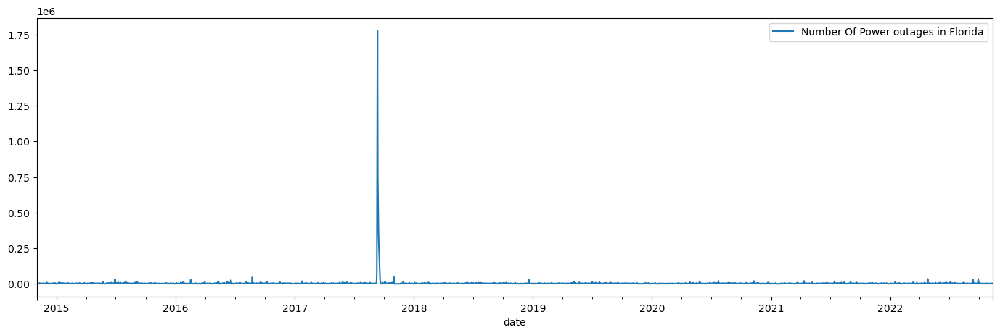

In [116]:
# loading library
import matplotlib.pyplot as plt
%matplotlib inline
series.plot(label="Number Of Power outages in Florida")
plt.legend();

In [117]:
from darts.dataprocessing.transformers import Scaler

In [118]:
df=df.reset_index()

In [119]:
scalerp=Scaler()

In [120]:
import pandas as pd
from darts import TimeSeries
from darts.dataprocessing.transformers import Scaler

In [121]:
df=df_final.reset_index()

In [122]:
df

,Date,Highest_Outage
0,2014-11-01 04:00:00,216.0
1,2014-11-01 05:00:00,245.0
2,2014-11-01 06:00:00,1822.0
3,2014-11-01 07:00:00,253.0
4,2014-11-01 08:00:00,157.0
...,...,...
70205,2022-11-12 01:00:00,0.0
70206,2022-11-12 02:00:00,0.0
70207,2022-11-12 03:00:00,0.0
70208,2022-11-12 04:00:00,0.0


# LSTM

In [123]:
# Convert the "run_start_time" column to a datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Create a new column 'date' containing only the date part of 'run_start_time'
df['date'] = df['Date'].dt.date

In [124]:
# Create a new column 'date' containing only the date part of 'run_start_time'
df['date'] = df['Date'].dt.date

In [125]:
df

,Date,Highest_Outage,date
0,2014-11-01 04:00:00,216.0,2014-11-01
1,2014-11-01 05:00:00,245.0,2014-11-01
2,2014-11-01 06:00:00,1822.0,2014-11-01
3,2014-11-01 07:00:00,253.0,2014-11-01
4,2014-11-01 08:00:00,157.0,2014-11-01
...,...,...,...
70205,2022-11-12 01:00:00,0.0,2022-11-12
70206,2022-11-12 02:00:00,0.0,2022-11-12
70207,2022-11-12 03:00:00,0.0,2022-11-12
70208,2022-11-12 04:00:00,0.0,2022-11-12


In [126]:
# Group the 'hourly_sum' data by date and sum the values for each date
df_grouped = df.groupby('date').sum()

In [127]:
df1=df_grouped

In [128]:
df1=df1.reset_index()

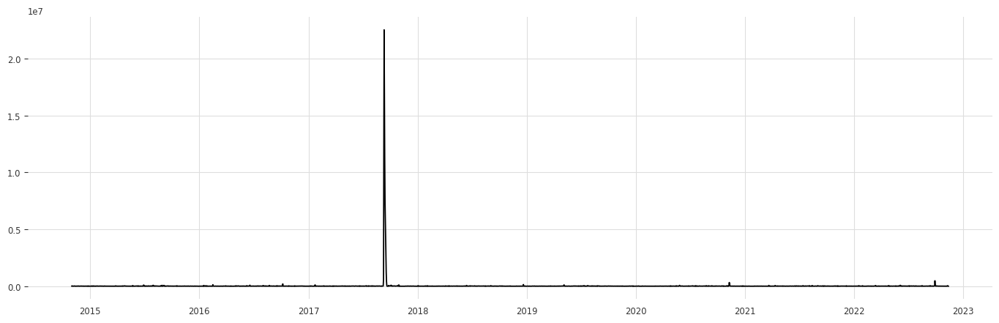

In [176]:
df1['date'] = pd.to_datetime(df1['date'])
plt.plot(df1['date'], df1['Highest_Outage'])

In [177]:
from copy import deepcopy as dc

def prepare_dataframe_for_lstm(df, n_steps):
    df = dc(df)
    
    df.set_index('date', inplace=True)
    
    for i in range(1, n_steps+1):
        df[f'Highest_Outage(t-{i})'] = df['Highest_Outage'].shift(i)
        
    df.dropna(inplace=True)
    
    return df

lookback = 7
shifted_df = prepare_dataframe_for_lstm(df1, lookback)
shifted_df

,Highest_Outage,Highest_Outage(t-1),Highest_Outage(t-2),Highest_Outage(t-3),Highest_Outage(t-4),Highest_Outage(t-5),Highest_Outage(t-6),Highest_Outage(t-7)
date,,,,,,,,
2014-11-08,2589.0,7945.0,8072.0,8781.0,9829.0,5949.0,25682.0,15671.0
2014-11-09,17839.0,2589.0,7945.0,8072.0,8781.0,9829.0,5949.0,25682.0
2014-11-10,21634.0,17839.0,2589.0,7945.0,8072.0,8781.0,9829.0,5949.0
2014-11-11,10158.0,21634.0,17839.0,2589.0,7945.0,8072.0,8781.0,9829.0
2014-11-12,3137.0,10158.0,21634.0,17839.0,2589.0,7945.0,8072.0,8781.0
...,...,...,...,...,...,...,...,...
2022-11-08,12800.0,10000.0,2321.0,4172.0,7909.0,6041.0,7250.0,7478.0
2022-11-09,44047.0,12800.0,10000.0,2321.0,4172.0,7909.0,6041.0,7250.0
2022-11-10,33356.0,44047.0,12800.0,10000.0,2321.0,4172.0,7909.0,6041.0


In [178]:
df1

,date,Highest_Outage
0,2014-11-01,15671.0
1,2014-11-02,25682.0
2,2014-11-03,5949.0
3,2014-11-04,9829.0
4,2014-11-05,8781.0
...,...,...
2929,2022-11-08,12800.0
2930,2022-11-09,44047.0
2931,2022-11-10,33356.0
2932,2022-11-11,60.0


In [179]:
shifted_df_as_np = shifted_df.to_numpy()

shifted_df_as_np

array([[ 2589.,  7945.,  8072., ...,  5949., 25682., 15671.],
       [17839.,  2589.,  7945., ...,  9829.,  5949., 25682.],
       [21634., 17839.,  2589., ...,  8781.,  9829.,  5949.],
       ...,
       [33356., 44047., 12800., ...,  4172.,  7909.,  6041.],
       [   60., 33356., 44047., ...,  2321.,  4172.,  7909.],
       [    0.,    60., 33356., ..., 10000.,  2321.,  4172.]])

In [180]:
shifted_df_as_np.shape

(2927, 8)

In [181]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-1, 1))
shifted_df_as_np = scaler.fit_transform(shifted_df_as_np)

shifted_df_as_np

array([[-0.99977005, -0.99929434, -0.99928306, ..., -0.99947162,
        -0.99771899, -0.99860814],
       [-0.99841558, -0.99977005, -0.99929434, ..., -0.99912701,
        -0.99947162, -0.99771899],
       [-0.99807852, -0.99841558, -0.99977005, ..., -0.99922009,
        -0.99912701, -0.99947162],
       ...,
       [-0.9970374 , -0.99608785, -0.99886313, ..., -0.99962945,
        -0.99929754, -0.99946345],
       [-0.99999467, -0.9970374 , -0.99608785, ..., -0.99979385,
        -0.99962945, -0.99929754],
       [-1.        , -0.99999467, -0.9970374 , ..., -0.99911182,
        -0.99979385, -0.99962945]])

In [182]:
X = shifted_df_as_np[:, 1:]
y = shifted_df_as_np[:, 0]

X.shape, y.shape

((2927, 7), (2927,))

In [183]:
X = dc(np.flip(X, axis=1))
X

array([[-0.99860814, -0.99771899, -0.99947162, ..., -0.99922009,
        -0.99928306, -0.99929434],
       [-0.99771899, -0.99947162, -0.99912701, ..., -0.99928306,
        -0.99929434, -0.99977005],
       [-0.99947162, -0.99912701, -0.99922009, ..., -0.99929434,
        -0.99977005, -0.99841558],
       ...,
       [-0.99946345, -0.99929754, -0.99962945, ..., -0.99911182,
        -0.99886313, -0.99608785],
       [-0.99929754, -0.99962945, -0.99979385, ..., -0.99886313,
        -0.99608785, -0.9970374 ],
       [-0.99962945, -0.99979385, -0.99911182, ..., -0.99608785,
        -0.9970374 , -0.99999467]])

In [184]:
split_index = int(len(X) * 0.95)

split_index

2780

In [185]:
X_train = X[:split_index]
X_test = X[split_index:]

y_train = y[:split_index]
y_test = y[split_index:]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2780, 7), (147, 7), (2780,), (147,))

In [186]:
X_train = X_train.reshape((-1, lookback, 1))
X_test = X_test.reshape((-1, lookback, 1))

y_train = y_train.reshape((-1, 1))
y_test = y_test.reshape((-1, 1))

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2780, 7, 1), (147, 7, 1), (2780, 1), (147, 1))

In [187]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn

In [188]:
X_train = torch.tensor(X_train).float()
y_train = torch.tensor(y_train).float()
X_test = torch.tensor(X_test).float()
y_test = torch.tensor(y_test).float()

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([2780, 7, 1]),
 torch.Size([147, 7, 1]),
 torch.Size([2780, 1]),
 torch.Size([147, 1]))

In [189]:
from torch.utils.data import Dataset

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i], self.y[i]
    
train_dataset = TimeSeriesDataset(X_train, y_train)
test_dataset = TimeSeriesDataset(X_test, y_test)

In [190]:
train_dataset

In [191]:
from torch.utils.data import DataLoader

batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [192]:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break

NameError: name 'device' is not defined

In [193]:
import torch

# Check if a GPU is available, and if so, use it; otherwise, use the CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming your train_loader is already defined, you can now use the device as follows:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break

torch.Size([16, 7, 1]) torch.Size([16, 1])


In [194]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers, 
                            batch_first=True)
        
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

model = LSTM(1, 4, 1)
model.to(device)
model

LSTM(
  (lstm): LSTM(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [195]:
def train_one_epoch():
    model.train(True)
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0
    
    for batch_index, batch in enumerate(train_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)
        
        output = model(x_batch)
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch_index % 100 == 99:  # print every 100 batches
            avg_loss_across_batches = running_loss / 100
            print('Batch {0}, Loss: {1:.3f}'.format(batch_index+1,
                                                    avg_loss_across_batches))
            running_loss = 0.0
    print()

In [196]:
def validate_one_epoch():
    model.train(False)
    running_loss = 0.0
    
    for batch_index, batch in enumerate(test_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)
        
        with torch.no_grad():
            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_across_batches = running_loss / len(test_loader)
    
    print('Val Loss: {0:.3f}'.format(avg_loss_across_batches))
    print('***************************************************')
    print()

In [198]:
learning_rate = 0.001
num_epochs = 10
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    train_one_epoch()
    validate_one_epoch()

Epoch: 1
Batch 100, Loss: 0.359

Val Loss: 0.000
***************************************************

Epoch: 2
Batch 100, Loss: 0.003

Val Loss: 0.000
***************************************************

Epoch: 3
Batch 100, Loss: 0.001

Val Loss: 0.000
***************************************************

Epoch: 4
Batch 100, Loss: 0.003

Val Loss: 0.000
***************************************************

Epoch: 5
Batch 100, Loss: 0.002

Val Loss: 0.000
***************************************************

Epoch: 6
Batch 100, Loss: 0.002

Val Loss: 0.000
***************************************************

Epoch: 7
Batch 100, Loss: 0.004

Val Loss: 0.000
***************************************************

Epoch: 8
Batch 100, Loss: 0.002

Val Loss: 0.000
***************************************************

Epoch: 9
Batch 100, Loss: 0.005

Val Loss: 0.000
***************************************************

Epoch: 10
Batch 100, Loss: 0.002

Val Loss: 0.000
********************************

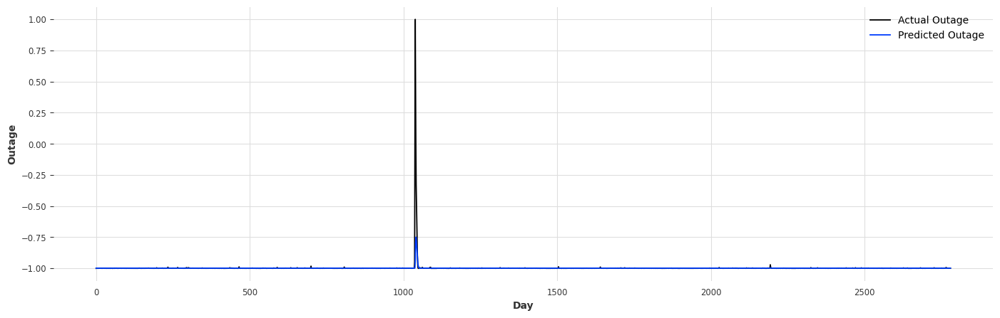

In [199]:
with torch.no_grad():
    predicted = model(X_train.to(device)).to('cpu').numpy()

plt.plot(y_train, label='Actual Outage')
plt.plot(predicted, label='Predicted Outage')
plt.xlabel('Day')
plt.ylabel('Outage')
plt.legend()
plt.show()

In [200]:
train_predictions = predicted.flatten()

dummies = np.zeros((X_train.shape[0], lookback+1))
dummies[:, 0] = train_predictions
dummies = scaler.inverse_transform(dummies)

train_predictions = dc(dummies[:, 0])
train_predictions

array([15870.6188482 , 15524.33615863, 16069.26163137, ...,
       16145.76594651, 16785.31517744, 16770.5511868 ])

In [201]:
dummies = np.zeros((X_train.shape[0], lookback+1))
dummies[:, 0] = y_train.flatten()
dummies = scaler.inverse_transform(dummies)

new_y_train = dc(dummies[:, 0])
new_y_train

array([ 2589.06708598, 17838.9272368 , 21633.94392192, ...,
       23545.88070989, 12586.30202115,  9318.76245618])

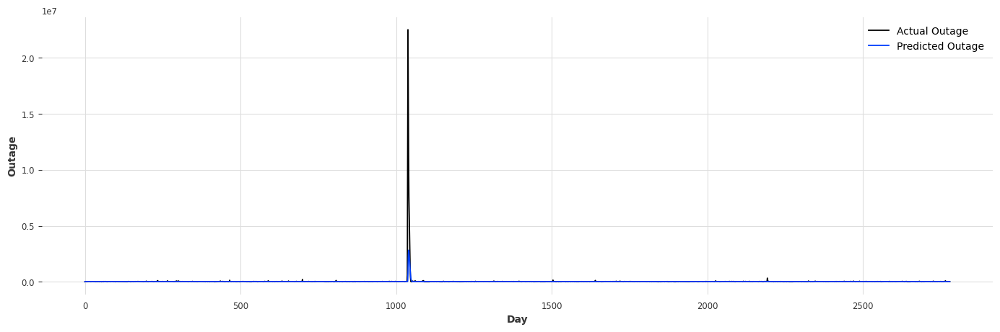

In [202]:
plt.plot(new_y_train, label='Actual Outage')
plt.plot(train_predictions, label='Predicted Outage')
plt.xlabel('Day')
plt.ylabel('Outage')
plt.legend()
plt.show()

In [203]:
test_predictions = model(X_test.to(device)).detach().cpu().numpy().flatten()

dummies = np.zeros((X_test.shape[0], lookback+1))
dummies[:, 0] = test_predictions
dummies = scaler.inverse_transform(dummies)

test_predictions = dc(dummies[:, 0])
test_predictions

array([16479.96900737, 16143.08158457, 16393.39833498, 16490.70645511,
       16192.74228036, 16430.30831158, 16379.30543482, 16169.25411344,
       15788.7458092 , 15535.07360637, 15866.5923053 , 15839.07759547,
       16235.69207132, 16262.53569067, 16152.47685134, 15914.91082013,
       17512.77726173, 17120.18932879, 16413.53104949, 16387.35852063,
       16182.67592311, 16295.41912436, 17179.91638184, 17656.39062524,
       17143.00640523, 16615.52928507, 16669.88761425, 16516.20789349,
       16324.94710565, 16653.11035216, 17431.57531321, 17223.53726327,
       16943.0214411 , 17224.20835376, 16660.49234748, 15960.54497302,
       15592.11629748, 15631.03954554, 16855.77967823, 17330.91174066,
       16943.0214411 , 16398.09596837, 15992.08622575, 15518.96743476,
       15304.21847999, 15451.18729591, 15866.5923053 , 15807.53634274,
       15771.29745662, 15654.52771246, 15532.38924444, 15633.05281699,
       15734.38748002, 16309.51202452, 16579.29039896, 16447.08557367,
      

In [204]:
dummies = np.zeros((X_test.shape[0], lookback+1))
dummies[:, 0] = y_test.flatten()
dummies = scaler.inverse_transform(dummies)

new_y_test = dc(dummies[:, 0])
new_y_test

array([6.83774094e+03, 1.64497699e+04, 1.36982990e+04, 7.36521806e+03,
       1.62840106e+04, 1.06582591e+04, 8.30608692e+03, 3.96614476e+03,
       4.17820935e+03, 1.36298477e+04, 7.51621342e+03, 1.64960752e+04,
       1.03260693e+04, 8.96107123e+03, 6.02974800e+03, 4.13767549e+04,
       7.62090353e+03, 5.02512554e+03, 1.31157924e+04, 8.17723754e+03,
       1.41720888e+04, 2.97038070e+04, 2.41941541e+04, 9.44425638e+03,
       8.26783476e+03, 1.60263118e+04, 1.14709496e+04, 1.06938269e+04,
       1.89717280e+04, 2.83139786e+04, 1.31869280e+04, 1.32332332e+04,
       2.20151233e+04, 6.15725519e+03, 2.49914096e+03, 4.26679330e+03,
       8.60807763e+03, 3.15291731e+04, 2.17661487e+04, 9.55297303e+03,
       5.69688712e+03, 5.44522818e+03, 1.65289586e+03, 4.32987580e+03,
       8.53224441e+03, 1.35338818e+04, 6.21698224e+03, 7.53231959e+03,
       5.37610586e+03, 5.05800898e+03, 8.78591661e+03, 8.91879253e+03,
       1.87341619e+04, 1.53008630e+04, 1.00603174e+04, 1.19212514e+04,
      

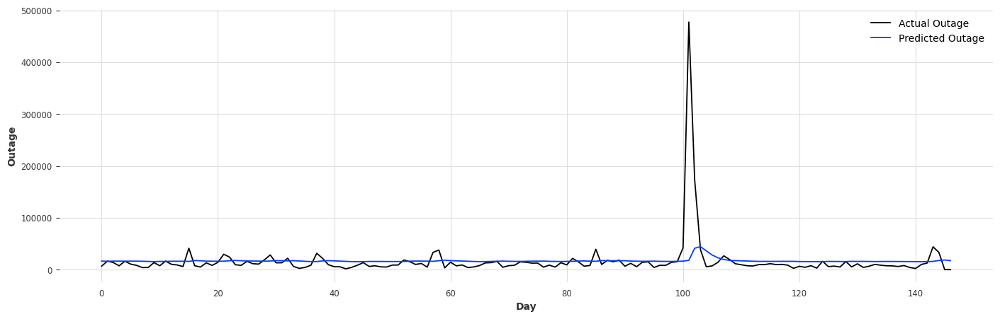

In [205]:
plt.plot(new_y_test, label='Actual Outage')
plt.plot(test_predictions, label='Predicted Outage')
plt.xlabel('Day')
plt.ylabel('Outage')
plt.legend()
plt.show()

In [206]:
df1

,date,Highest_Outage
0,2014-11-01,15671.0
1,2014-11-02,25682.0
2,2014-11-03,5949.0
3,2014-11-04,9829.0
4,2014-11-05,8781.0
...,...,...
2929,2022-11-08,12800.0
2930,2022-11-09,44047.0
2931,2022-11-10,33356.0
2932,2022-11-11,60.0


In [207]:
df

,Date,Highest_Outage,date
0,2014-11-01 04:00:00,216.0,2014-11-01
1,2014-11-01 05:00:00,245.0,2014-11-01
2,2014-11-01 06:00:00,1822.0,2014-11-01
3,2014-11-01 07:00:00,253.0,2014-11-01
4,2014-11-01 08:00:00,157.0,2014-11-01
...,...,...,...
70205,2022-11-12 01:00:00,0.0,2022-11-12
70206,2022-11-12 02:00:00,0.0,2022-11-12
70207,2022-11-12 03:00:00,0.0,2022-11-12
70208,2022-11-12 04:00:00,0.0,2022-11-12


In [208]:
# Convert run_start_time to datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Set the run_start_time column as the DataFrame index
df.set_index('Date', inplace=True)

In [209]:
df

,Highest_Outage,date
Date,,
2014-11-01 04:00:00,216.0,2014-11-01
2014-11-01 05:00:00,245.0,2014-11-01
2014-11-01 06:00:00,1822.0,2014-11-01
2014-11-01 07:00:00,253.0,2014-11-01
2014-11-01 08:00:00,157.0,2014-11-01
...,...,...
2022-11-12 01:00:00,0.0,2022-11-12
2022-11-12 02:00:00,0.0,2022-11-12
2022-11-12 03:00:00,0.0,2022-11-12


In [210]:
# Group the 'hourly_sum' data by date and sum the values for each date
df_grouped = df.groupby('date').sum()

In [211]:
df1=df_grouped

In [212]:
df1=df1.reset_index()

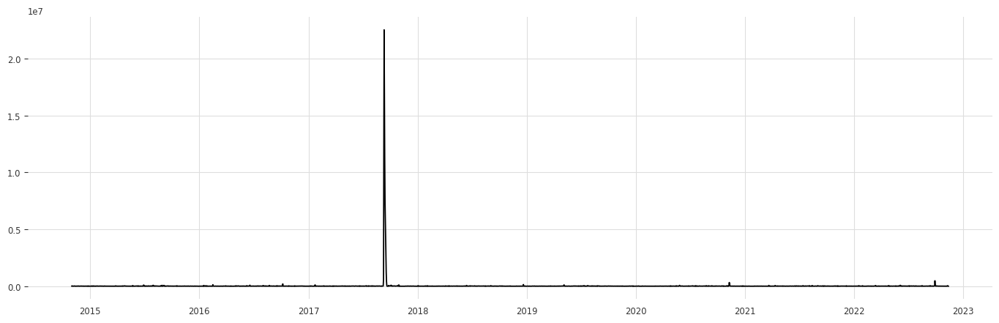

In [213]:
df1['date'] = pd.to_datetime(df1['date'])
plt.plot(df1['date'], df1['Highest_Outage'])

In [214]:
from copy import deepcopy as dc

def prepare_dataframe_for_lstm(df, n_steps):
    df = dc(df)
    
    df.set_index('date', inplace=True)
    
    for i in range(1, n_steps+1):
        df[f'Highest_Outage(t-{i})'] = df['Highest_Outage'].shift(i)
        
    df.dropna(inplace=True)
    
    return df

lookback = 7
shifted_df = prepare_dataframe_for_lstm(df1, lookback)
shifted_df

,Highest_Outage,Highest_Outage(t-1),Highest_Outage(t-2),Highest_Outage(t-3),Highest_Outage(t-4),Highest_Outage(t-5),Highest_Outage(t-6),Highest_Outage(t-7)
date,,,,,,,,
2014-11-08,2589.0,7945.0,8072.0,8781.0,9829.0,5949.0,25682.0,15671.0
2014-11-09,17839.0,2589.0,7945.0,8072.0,8781.0,9829.0,5949.0,25682.0
2014-11-10,21634.0,17839.0,2589.0,7945.0,8072.0,8781.0,9829.0,5949.0
2014-11-11,10158.0,21634.0,17839.0,2589.0,7945.0,8072.0,8781.0,9829.0
2014-11-12,3137.0,10158.0,21634.0,17839.0,2589.0,7945.0,8072.0,8781.0
...,...,...,...,...,...,...,...,...
2022-11-08,12800.0,10000.0,2321.0,4172.0,7909.0,6041.0,7250.0,7478.0
2022-11-09,44047.0,12800.0,10000.0,2321.0,4172.0,7909.0,6041.0,7250.0
2022-11-10,33356.0,44047.0,12800.0,10000.0,2321.0,4172.0,7909.0,6041.0


In [215]:
df1

,date,Highest_Outage
0,2014-11-01,15671.0
1,2014-11-02,25682.0
2,2014-11-03,5949.0
3,2014-11-04,9829.0
4,2014-11-05,8781.0
...,...,...
2929,2022-11-08,12800.0
2930,2022-11-09,44047.0
2931,2022-11-10,33356.0
2932,2022-11-11,60.0


In [216]:
shifted_df_as_np = shifted_df.to_numpy()

shifted_df_as_np

array([[ 2589.,  7945.,  8072., ...,  5949., 25682., 15671.],
       [17839.,  2589.,  7945., ...,  9829.,  5949., 25682.],
       [21634., 17839.,  2589., ...,  8781.,  9829.,  5949.],
       ...,
       [33356., 44047., 12800., ...,  4172.,  7909.,  6041.],
       [   60., 33356., 44047., ...,  2321.,  4172.,  7909.],
       [    0.,    60., 33356., ..., 10000.,  2321.,  4172.]])

In [217]:
shifted_df_as_np.shape

(2927, 8)

In [218]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler(feature_range=(-1, 1))
shifted_df_as_np = scaler.fit_transform(shifted_df_as_np)

shifted_df_as_np

array([[-0.99977005, -0.99929434, -0.99928306, ..., -0.99947162,
        -0.99771899, -0.99860814],
       [-0.99841558, -0.99977005, -0.99929434, ..., -0.99912701,
        -0.99947162, -0.99771899],
       [-0.99807852, -0.99841558, -0.99977005, ..., -0.99922009,
        -0.99912701, -0.99947162],
       ...,
       [-0.9970374 , -0.99608785, -0.99886313, ..., -0.99962945,
        -0.99929754, -0.99946345],
       [-0.99999467, -0.9970374 , -0.99608785, ..., -0.99979385,
        -0.99962945, -0.99929754],
       [-1.        , -0.99999467, -0.9970374 , ..., -0.99911182,
        -0.99979385, -0.99962945]])

In [219]:
X = shifted_df_as_np[:, 1:]
y = shifted_df_as_np[:, 0]

X.shape, y.shape

((2927, 7), (2927,))

In [220]:
X = dc(np.flip(X, axis=1))
X

array([[-0.99860814, -0.99771899, -0.99947162, ..., -0.99922009,
        -0.99928306, -0.99929434],
       [-0.99771899, -0.99947162, -0.99912701, ..., -0.99928306,
        -0.99929434, -0.99977005],
       [-0.99947162, -0.99912701, -0.99922009, ..., -0.99929434,
        -0.99977005, -0.99841558],
       ...,
       [-0.99946345, -0.99929754, -0.99962945, ..., -0.99911182,
        -0.99886313, -0.99608785],
       [-0.99929754, -0.99962945, -0.99979385, ..., -0.99886313,
        -0.99608785, -0.9970374 ],
       [-0.99962945, -0.99979385, -0.99911182, ..., -0.99608785,
        -0.9970374 , -0.99999467]])

In [221]:
split_index = int(len(X) * 0.95)

split_index

2780

In [222]:
X_train = X[:split_index]
X_test = X[split_index:]

y_train = y[:split_index]
y_test = y[split_index:]

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2780, 7), (147, 7), (2780,), (147,))

In [223]:
X_train = X_train.reshape((-1, lookback, 1))
X_test = X_test.reshape((-1, lookback, 1))

y_train = y_train.reshape((-1, 1))
y_test = y_test.reshape((-1, 1))

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((2780, 7, 1), (147, 7, 1), (2780, 1), (147, 1))

In [224]:
X_train = torch.tensor(X_train).float()
y_train = torch.tensor(y_train).float()
X_test = torch.tensor(X_test).float()
y_test = torch.tensor(y_test).float()

X_train.shape, X_test.shape, y_train.shape, y_test.shape

(torch.Size([2780, 7, 1]),
 torch.Size([147, 7, 1]),
 torch.Size([2780, 1]),
 torch.Size([147, 1]))

In [225]:
from torch.utils.data import Dataset

class TimeSeriesDataset(Dataset):
    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.X)

    def __getitem__(self, i):
        return self.X[i], self.y[i]
    
train_dataset = TimeSeriesDataset(X_train, y_train)
test_dataset = TimeSeriesDataset(X_test, y_test)

In [226]:
train_dataset

In [227]:
from torch.utils.data import DataLoader

batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [228]:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break

torch.Size([16, 7, 1]) torch.Size([16, 1])


In [229]:
import torch

# Check if a GPU is available, and if so, use it; otherwise, use the CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Assuming your train_loader is already defined, you can now use the device as follows:
for _, batch in enumerate(train_loader):
    x_batch, y_batch = batch[0].to(device), batch[1].to(device)
    print(x_batch.shape, y_batch.shape)
    break

torch.Size([16, 7, 1]) torch.Size([16, 1])


In [230]:
class LSTM(nn.Module):
    def __init__(self, input_size, hidden_size, num_stacked_layers):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_stacked_layers = num_stacked_layers

        self.lstm = nn.LSTM(input_size, hidden_size, num_stacked_layers, 
                            batch_first=True)
        
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        c0 = torch.zeros(self.num_stacked_layers, batch_size, self.hidden_size).to(device)
        
        out, _ = self.lstm(x, (h0, c0))
        out = self.fc(out[:, -1, :])
        return out

model = LSTM(1, 4, 1)
model.to(device)
model

LSTM(
  (lstm): LSTM(1, 4, batch_first=True)
  (fc): Linear(in_features=4, out_features=1, bias=True)
)

In [231]:
def train_one_epoch():
    model.train(True)
    print(f'Epoch: {epoch + 1}')
    running_loss = 0.0
    
    for batch_index, batch in enumerate(train_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)
        
        output = model(x_batch)
        loss = loss_function(output, y_batch)
        running_loss += loss.item()
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch_index % 100 == 99:  # print every 100 batches
            avg_loss_across_batches = running_loss / 100
            print('Batch {0}, Loss: {1:.3f}'.format(batch_index+1,
                                                    avg_loss_across_batches))
            running_loss = 0.0
    print()

In [232]:
def validate_one_epoch():
    model.train(False)
    running_loss = 0.0
    
    for batch_index, batch in enumerate(test_loader):
        x_batch, y_batch = batch[0].to(device), batch[1].to(device)
        
        with torch.no_grad():
            output = model(x_batch)
            loss = loss_function(output, y_batch)
            running_loss += loss.item()

    avg_loss_across_batches = running_loss / len(test_loader)
    
    print('Val Loss: {0:.3f}'.format(avg_loss_across_batches))
    print('***************************************************')
    print()

In [233]:
learning_rate = 0.001
num_epochs = 10
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    train_one_epoch()
    validate_one_epoch()

Epoch: 1
Batch 100, Loss: 0.482

Val Loss: 0.009
***************************************************

Epoch: 2
Batch 100, Loss: 0.005

Val Loss: 0.000
***************************************************

Epoch: 3
Batch 100, Loss: 0.004

Val Loss: 0.000
***************************************************

Epoch: 4
Batch 100, Loss: 0.003

Val Loss: 0.000
***************************************************

Epoch: 5
Batch 100, Loss: 0.002

Val Loss: 0.000
***************************************************

Epoch: 6
Batch 100, Loss: 0.001

Val Loss: 0.000
***************************************************

Epoch: 7
Batch 100, Loss: 0.004

Val Loss: 0.000
***************************************************

Epoch: 8
Batch 100, Loss: 0.003

Val Loss: 0.000
***************************************************

Epoch: 9
Batch 100, Loss: 0.002

Val Loss: 0.000
***************************************************

Epoch: 10
Batch 100, Loss: 0.001

Val Loss: 0.000
********************************

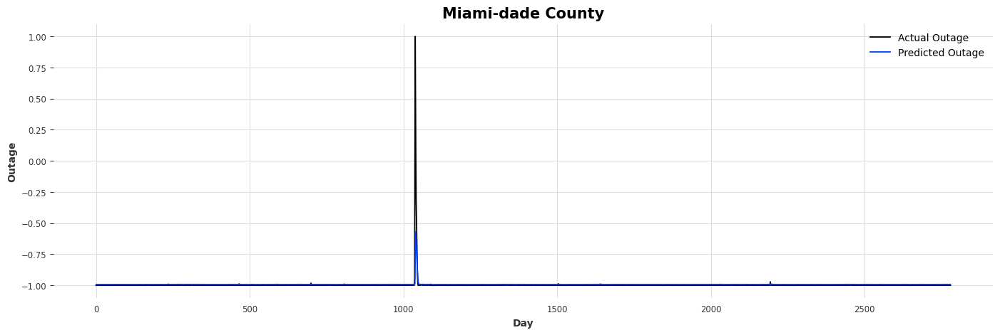

In [234]:
with torch.no_grad():
    predicted = model(X_train.to(device)).to('cpu').numpy()

plt.plot(y_train, label='Actual Outage')
plt.plot(predicted, label='Predicted Outage')
plt.title('Miami-dade County', weight='bold', fontsize=15)
plt.xlabel('Day')
plt.ylabel('Outage')
plt.legend()
plt.show()